In [0]:
import warnings
warnings.filterwarnings("ignore")

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import cv2


# class created by me to handle Waymo dataset

class myFrames:
    def __init__(self):
        self.images = []
        self.camera_calibrations = []

# basic horizontal image flip

def flp(im):
    return np.flip(im, axis=1)
        
# Cylindrical warp

def cylindricalWarp(img, K):
    """This function returns the cylindrical warp for a given image and intrinsics matrix K"""
    h_,w_ = img.shape[:2]
    # pixel coordinates
    y_i, x_i = np.indices((h_,w_))
    X = np.stack([x_i,y_i,np.ones_like(x_i)],axis=-1).reshape(h_*w_,3) # to homog
    Kinv = np.linalg.inv(K) 
    X = Kinv.dot(X.T).T # normalized coords
    # calculate cylindrical coords (sin\theta, h, cos\theta)
    A = np.stack([np.sin(X[:,0]),X[:,1],np.cos(X[:,0])],axis=-1).reshape(w_*h_,3)
    B = K.dot(A.T).T # project back to image-pixels plane
    # back from homog coords
    B = B[:,:-1] / B[:,[-1]]
    # make sure warp coords only within image bounds
    B[(B[:,0] < 0) | (B[:,0] >= w_) | (B[:,1] < 0) | (B[:,1] >= h_)] = -1
    B = B.reshape(h_,w_,-1)
    
    # warp the image according to cylindrical coords
    return cv2.remap(img, B[:,:,0].astype(np.float32), B[:,:,1].astype(np.float32), cv2.INTER_AREA), B


# Keypoint finder + descriptor calculation

def detectAndDescribe(image, method=None):
    """
    Compute key points and feature descriptors using an specific method
    """
    
    assert method is not None, "You need to define a feature detection method. Values are: 'sift', 'surf'"
    
    # detect and extract features from the image
    if method == 'sift':
        descriptor = cv2.xfeatures2d.SIFT_create()
    elif method == 'surf':
        descriptor = cv2.xfeatures2d.SURF_create()
    elif method == 'brisk':
        descriptor = cv2.BRISK_create()
    elif method == 'orb':
        descriptor = cv2.ORB_create()
        
    # get keypoints and descriptors
    (kps, features) = descriptor.detectAndCompute(image, None)
    
    return (kps, features)

# Match keypoints from 2 images 

def createMatcher(method,crossCheck):
    "Create and return a Matcher Object"
    
    if method == 'sift' or method == 'surf':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=crossCheck)
    elif method == 'orb' or method == 'brisk':
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=crossCheck)
    return bf

def border_searcher(im):
    w = im.shape[1]
    h = im.shape[0]
    
    i = h//2
    j = 0
    while sum(im[i][j]) == 0:
        j += 1
    j_start = j + 3 # 3 as security margin
    
    i = 0
    
    while sum(im[i][j]) == 0:
        i += 1
    i_start = i + 3

    return im[i_start : h - i_start, j_start: w - j_start, :]

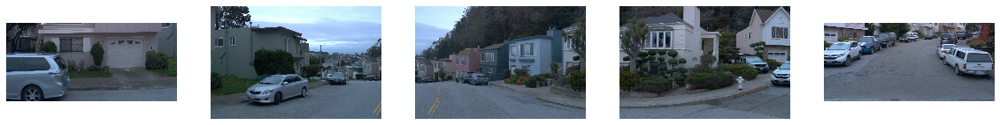

In [4]:
with open("./myframe.pickle", "rb") as f:
    myframes = pickle.load(f)
    

first_frame = myframes.images[0]
    
fig=plt.figure(figsize=(20, 20))
columns = 5
rows = 1
order = [2,1,0,3,4]
for i in range(1, columns*rows +1):
    img = first_frame[order[i-1]]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.axis('off')
plt.show()

In [0]:
def merge2(img1, img2):
    (kps1, des1) = detectAndDescribe(img1, method = 'sift')
    (kps2, des2) = detectAndDescribe(img2, method = 'sift')
    kimg1 = cv2.drawKeypoints(img1,kps1,None)
    kimg2 = cv2.drawKeypoints(img2,kps2,None)
    
    print('Key points detection:')
    fig=plt.figure(figsize=(10, 10))    
    plt.imshow(kimg1)
    plt.axis('off')
    plt.show()
    
    
    fig=plt.figure(figsize=(10, 10))    
    plt.imshow(kimg2)
    plt.axis('off')
    plt.show()
    
    
    bf = createMatcher('sift', False)

    # Match descriptors.
    matches = bf.knnMatch(des1,des2, k=2)

    print('Feature matching:')
    matchimg = cv2.drawMatchesKnn(img1,kps1,img2,kps2,matches[:40],None,flags=2)
    # cv2.imwrite("./results/sift_match.jpg",img3)
    fig=plt.figure(figsize=(10, 10))
    plt.imshow(matchimg)
    plt.axis('off')
    plt.show()
    
    print('Good feature matching:')
    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < 0.75*n.distance:
            good.append([m])

    # cv2.drawMatchesKnn expects list of lists as matches.
    img3 = cv2.drawMatchesKnn(img1,kps1,img2,kps2,good,None, flags=2)
    fig=plt.figure(figsize=(10, 10))
    plt.axis('off')    
    plt.imshow(img3)
    

    src_pts = np.float32([ kps1[m[0].queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kps2[m[0].trainIdx].pt for m in good ]).reshape(-1,1,2)
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
    
    width = (img2.shape[1] + img1.shape[1] )
    height = max(img2.shape[0] , img1.shape[0])

    im_dst = cv2.warpPerspective(img1, M, (width, height))
    
    nim = im_dst
        
    nim[:img2.shape[0], :img2.shape[1], :] = img2

    return nim

In [0]:
def merge5(cyl_imgs):
    im43 = merge2(cyl_imgs[4],cyl_imgs[3])
    im10 = flp(merge2(flp(cyl_imgs[0]),flp(cyl_imgs[1])))
    center_and_left = flp(merge2(flp(im10), flp(cyl_imgs[2])))
    center_and_left_and_right = merge2(im43, center_and_left)
    return center_and_left_and_right
def merge3(cyl_imgs):

    center_and_left = flp(merge2(flp(cyl_imgs[1]), flp(cyl_imgs[2])))
    
    center_and_left_and_right = merge2(cyl_imgs[3], center_and_left)
    return center_and_left_and_right

# With camera calibration

Cylindrical warping:


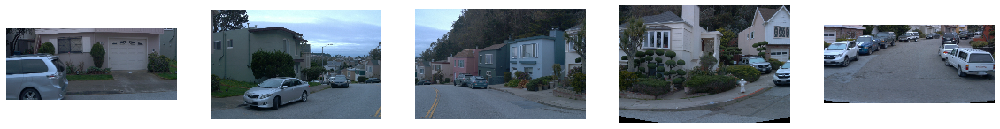

Key points detection:


<Figure size 720x720 with 0 Axes>

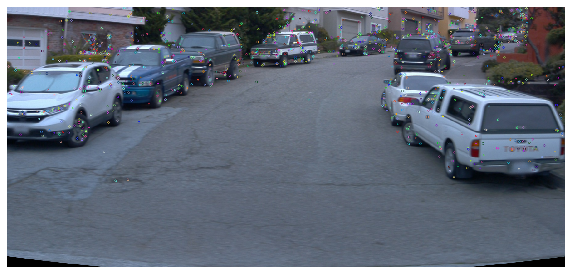

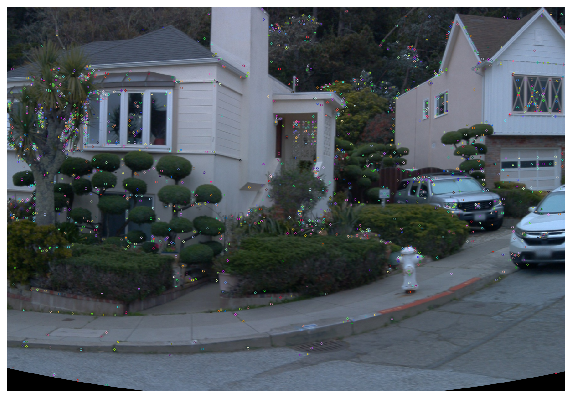

Feature matching:


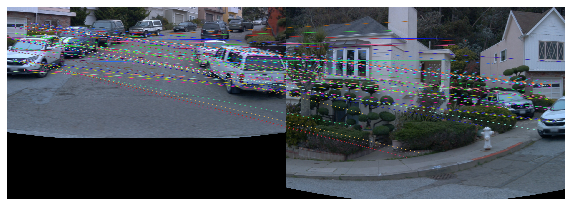

Good feature matching:
Key points detection:


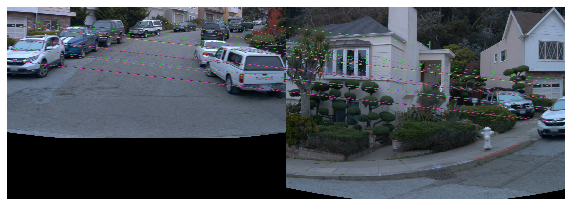

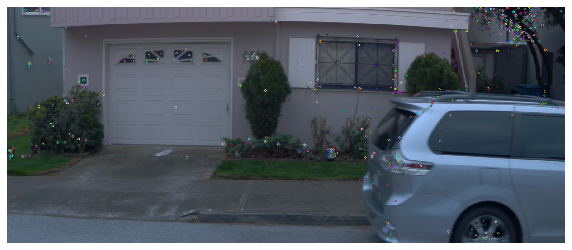

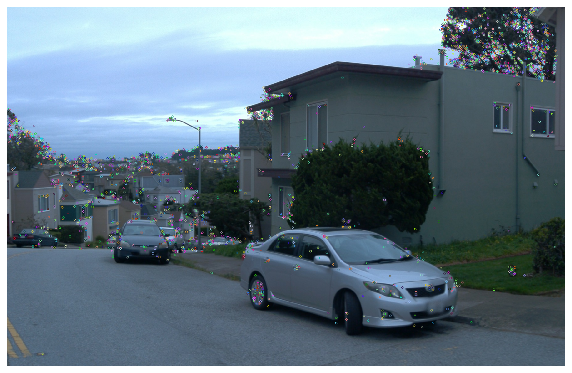

Feature matching:


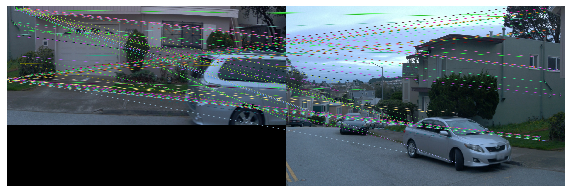

Good feature matching:
Key points detection:


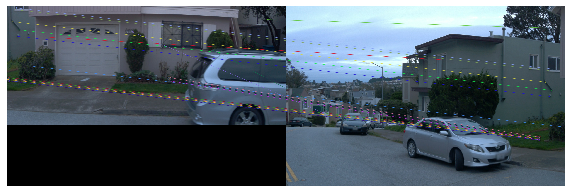

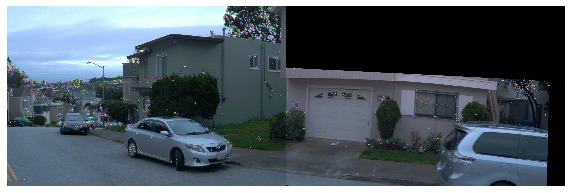

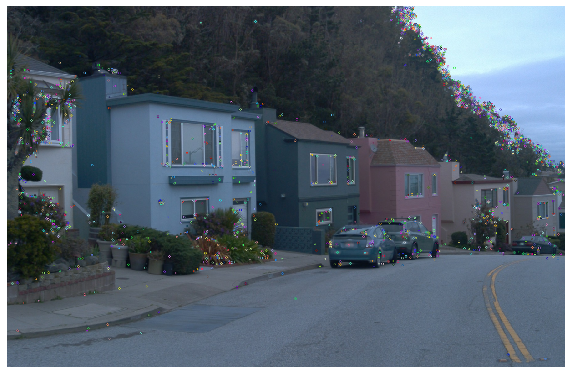

Feature matching:


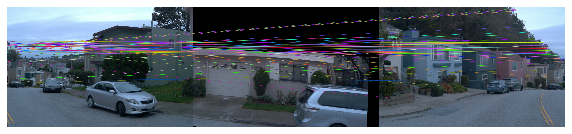

Good feature matching:
Key points detection:


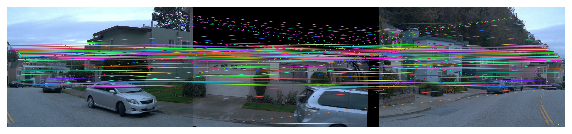

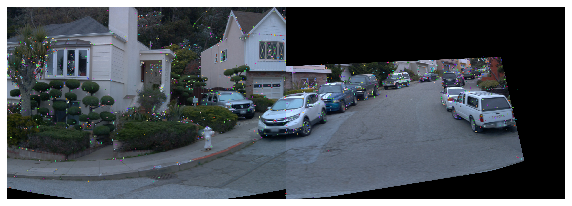

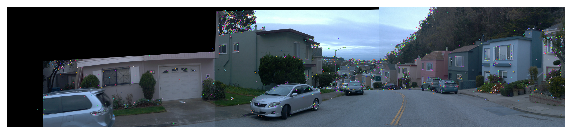

Feature matching:


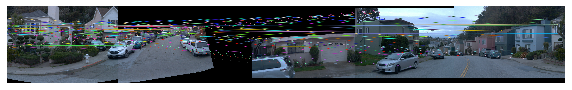

Good feature matching:
Stitching of 5 images:


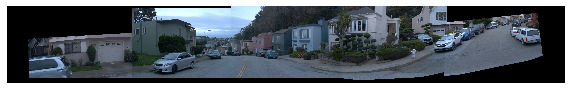

Key points detection:


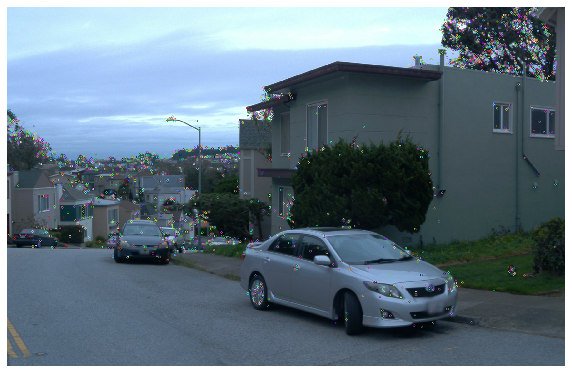

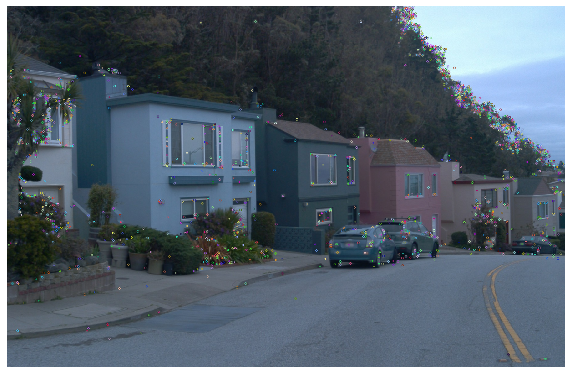

Feature matching:


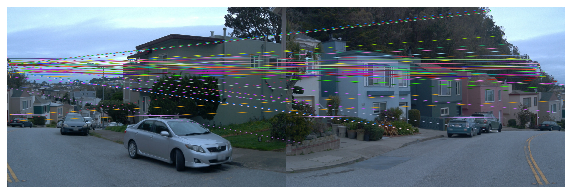

Good feature matching:
Key points detection:


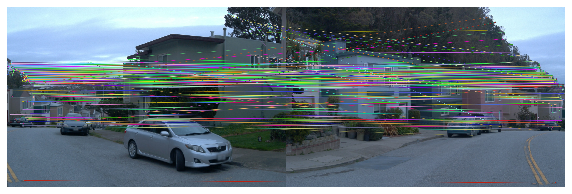

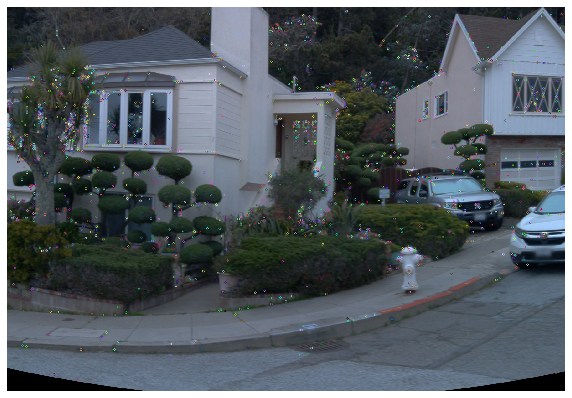

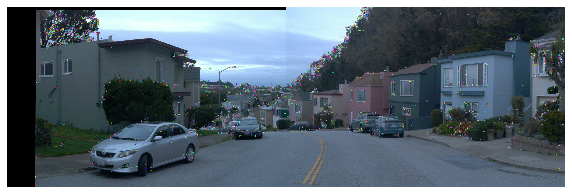

Feature matching:


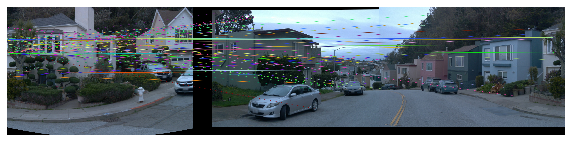

Good feature matching:
Stitching of 3 images:


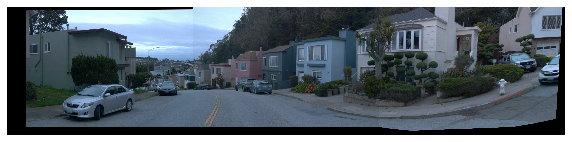

In [7]:
import matplotlib.pyplot as plt
import time 
fig=plt.figure(figsize=(20, 20))
columns = 5
rows = 1
order = [2,1,0,3,4]
cyl_imgs = []

print('Cylindrical warping:')
for i in range(1, columns*rows +1):
    img = first_frame[order[i-1]]
    h, w = img.shape[:2]
    intrinsics = myframes.camera_calibrations[order[i-1]+1][0]
    extrinsics = myframes.camera_calibrations[order[i-1]+1][1]
    K = np.array([[intrinsics[0],0,intrinsics[2]],[0,intrinsics[1],intrinsics[3]],[0,0,1]]) # mock intrinsics
    E = np.array(extrinsics).reshape((4,4))
    img = cv2.undistort(img, K, np.array(intrinsics[4:]))
    img_cyl, B_ = cylindricalWarp(img, K)
    img_cyl = border_searcher(img_cyl)
    
    fig.add_subplot(rows, columns, i)
    plt.imshow(img_cyl)
    plt.axis('off')
    cyl_imgs.append(img_cyl)
plt.show()

fig=plt.figure(figsize=(10, 10))
t0c=time.clock()
im5_cy = merge5(cyl_imgs)
tfc=time.clock()
print('Stitching of 5 images:')
plt.imshow(im5_cy)
plt.axis('off')
plt.show()

im3_cy = merge3(cyl_imgs)
print('Stitching of 3 images:')
plt.imshow(im3_cy)
plt.axis('off')
plt.show()

# Without camera calibration

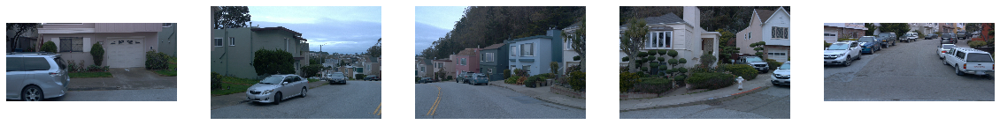

Key points detection:


<Figure size 720x720 with 0 Axes>

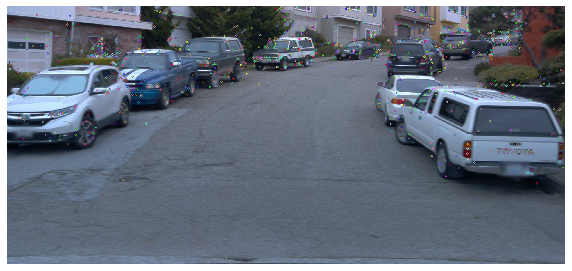

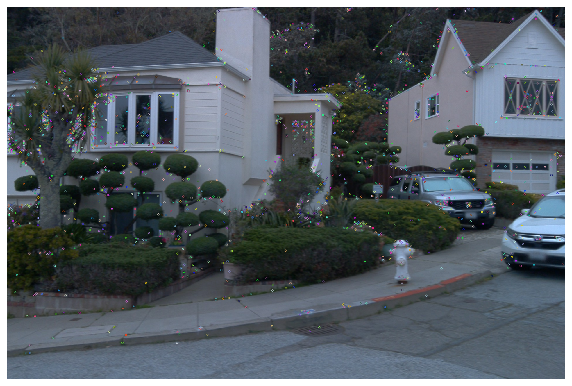

Feature matching:


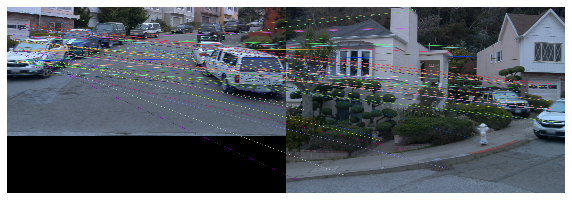

Good feature matching:
Key points detection:


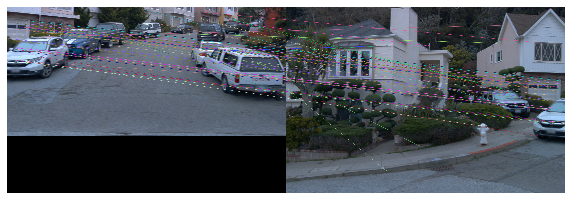

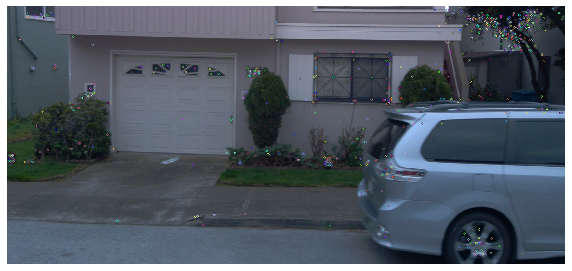

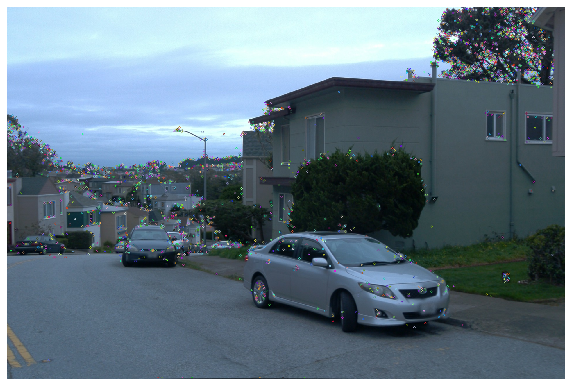

Feature matching:


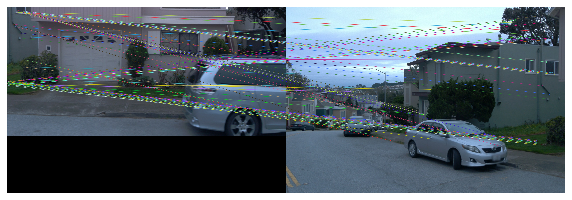

Good feature matching:
Key points detection:


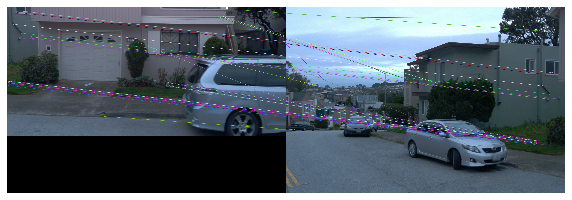

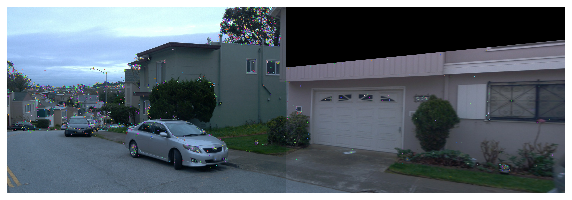

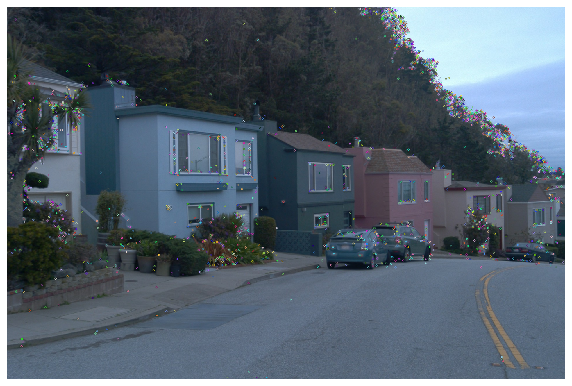

Feature matching:


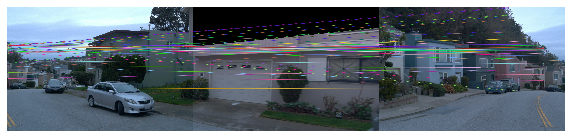

Good feature matching:
Key points detection:


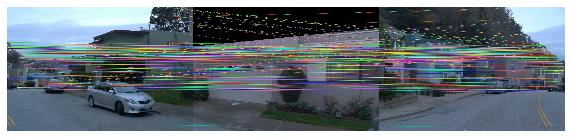

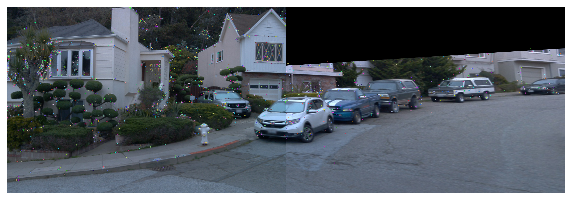

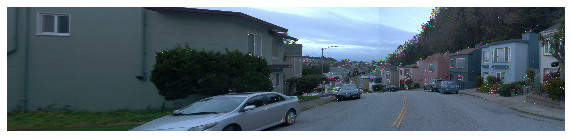

Feature matching:


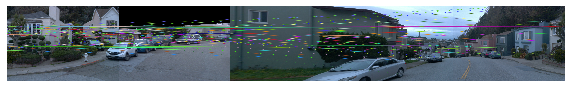

Good feature matching:
Stitching of 5 images:


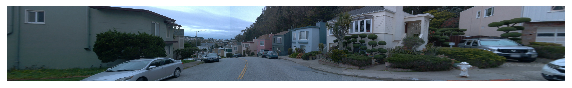

Key points detection:


<Figure size 720x720 with 0 Axes>

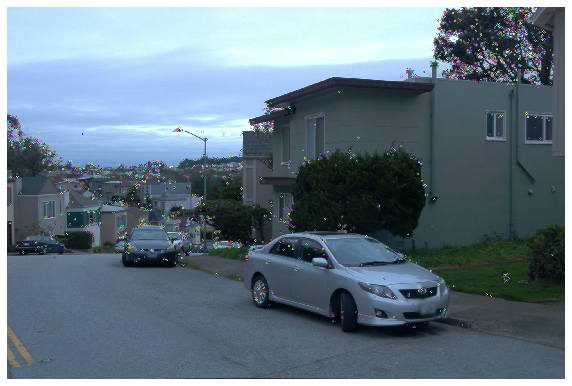

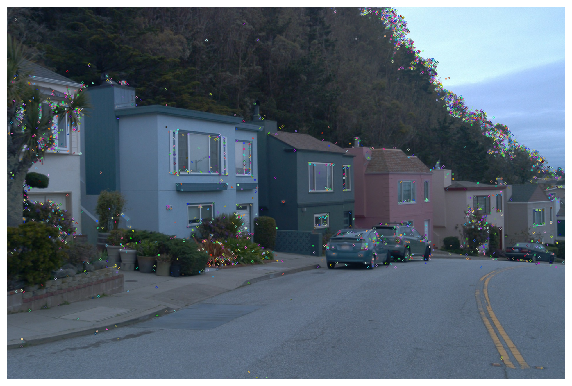

Feature matching:


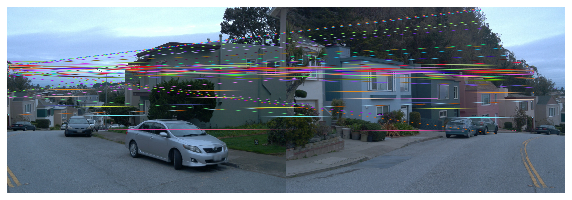

Good feature matching:
Key points detection:


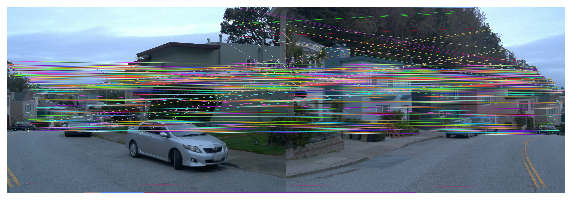

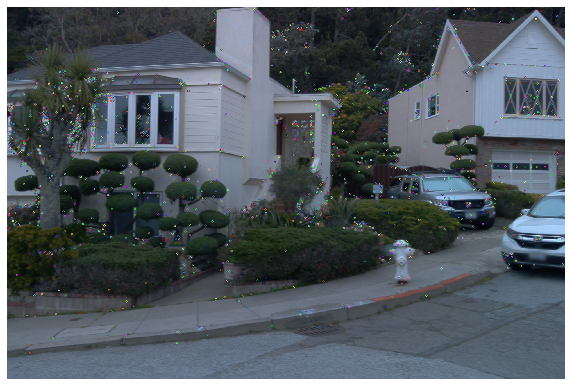

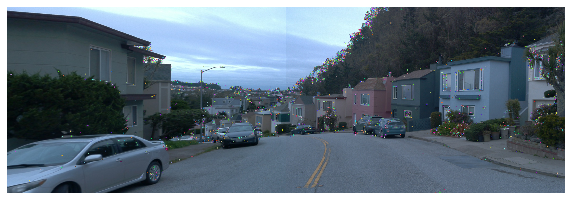

Feature matching:


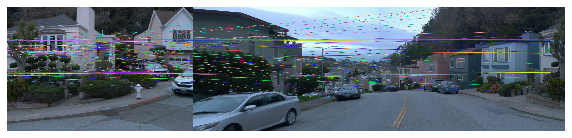

Good feature matching:
Stitching of 3 images:


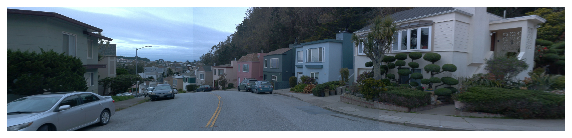

In [10]:
 
fig=plt.figure(figsize=(20, 20))
columns = 5
rows = 1
order = [2,1,0,3,4]
pure_images = []

for i in range(1, columns*rows +1):
  img = first_frame[order[i-1]]
  intrinsics = myframes.camera_calibrations[order[i-1]+1][0]
  extrinsics = myframes.camera_calibrations[order[i-1]+1][1]
  K = np.array([[intrinsics[0],0,intrinsics[2]],[0,intrinsics[1],intrinsics[3]],[0,0,1]]) # mock intrinsics
  E = np.array(extrinsics).reshape((4,4))
  img = cv2.undistort(img, K, np.array(intrinsics[4:]))
  fig.add_subplot(rows, columns, i)
  plt.imshow(img)
  plt.axis('off')
  pure_images.append(img)
plt.show()

fig=plt.figure(figsize=(10, 10))
t0=time.clock()
im5 = merge5(pure_images)
tf=time.clock()
print('Stitching of 5 images:')
plt.imshow(im5)
plt.axis('off')
plt.show()


fig=plt.figure(figsize=(10, 10))
im3 = merge3(pure_images)
print('Stitching of 3 images:')
plt.imshow(im3)
plt.axis('off')
plt.show()



In [0]:
from skimage.measure.entropy import shannon_entropy
print(shannon_entropy(im3_cy[:,:,0])) 

print(shannon_entropy(im3[:,:,0]))


7.073006416117288
7.404959487818058


In [0]:
mean1 = np.mean(im3_cy[:,:,0])
mean2 = np.mean(im3[:,:,0])

In [0]:
print(mean1)
print(mean2)

69.68150126677347
76.16171617296007


In [0]:
print('Execution time = '+str(tfc-t0c))
print('Execution time = '+str(tf-t0))


Execution time = 27.621321
Execution time = 31.710647
